In [ ]:
from google.colab import drive
drive.mount('/content/drive')
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import cv2
from google.colab.patches import cv2_imshow
import numpy as np

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


# Question 1

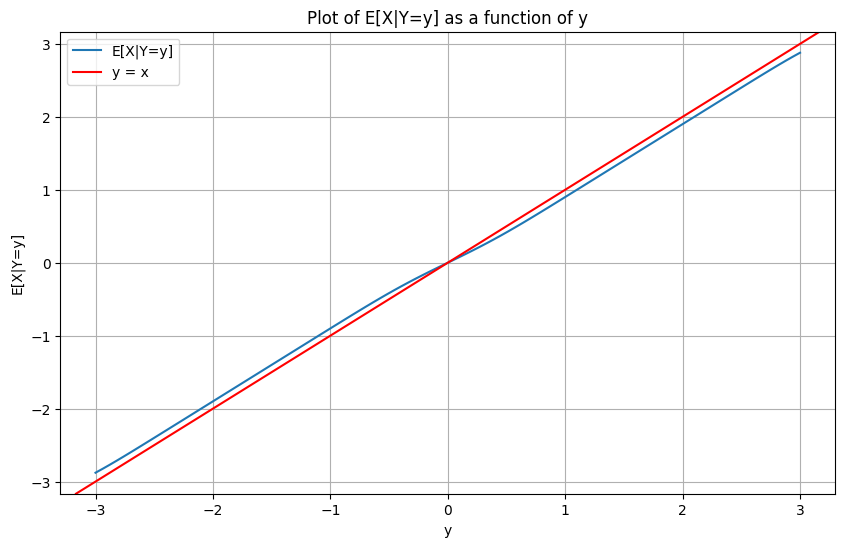

In [ ]:
class estimation():
  def __init__(self):
    self.sigma = np.sqrt(0.1)
    self.x= np.linspace(-3.5, 3.5, 100)

  def f_x(self,x):
      return np.exp(-np.abs(x)) / 2

  def f_y_given_x(self,y,x):
     return (1.0 / (np.sqrt(2 * np.pi * self.sigma**2))) * np.exp(-((y - x)**2) / (2 * self.sigma**2))

  def f_joint(self,y):
      return self.f_x(self.x) * self.f_y_given_x(y, self.x)

  def f_y(self,y):
      return np.trapz(self.f_joint(y),x=self.x)

  def E_X_given_Y(self,y):
      return np.trapz(self.x*self.f_joint(y) / self.f_y(y), x=self.x)

y_values = np.linspace(-3, 3, 100)
E_X_given_Y_values = [estimation().E_X_given_Y(y) for y in y_values]
plt.figure(figsize=(10, 6))
plt.plot(y_values, E_X_given_Y_values, label='E[X|Y=y]')
plt.axline((0, 0), slope=1, color="red", label="y = x")
plt.xlabel('y')
plt.ylabel('E[X|Y=y]')
plt.title('Plot of E[X|Y=y] as a function of y')
plt.legend()
plt.grid(True)
plt.show()


# Question 2

array([[118, 115, 115, ..., 109, 114, 115],
       [118, 120, 119, ..., 117, 115, 120],
       [124, 118, 119, ..., 117, 117, 120],
       ...,
       [121, 115, 137, ...,  57,  52,  54],
       [116, 116, 130, ...,  50,  47,  51],
       [167, 141, 119, ...,  59,  61,  65]], dtype=uint8)
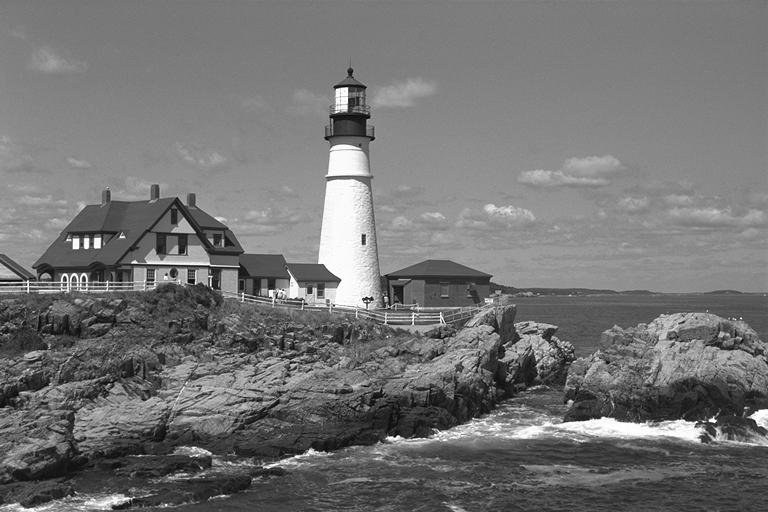

In [ ]:
data=cv2.imread('/content/drive/My Drive/lighthouse2.bmp')
image=cv2.cvtColor(data, cv2.COLOR_BGR2GRAY)
image

In [ ]:
noise_variance = 100
noise = np.random.normal(scale=np.sqrt(noise_variance), size=image.shape)
noisy_img = image+ noise

def MSE_Calculation(original_image,denoised_image):
  mse=np.mean((original_image-denoised_image)**2)
  return mse

MSE_Calculation(image,noisy_img)

100.05188889401302

# Question 2.1 Low pass Gaussian filter

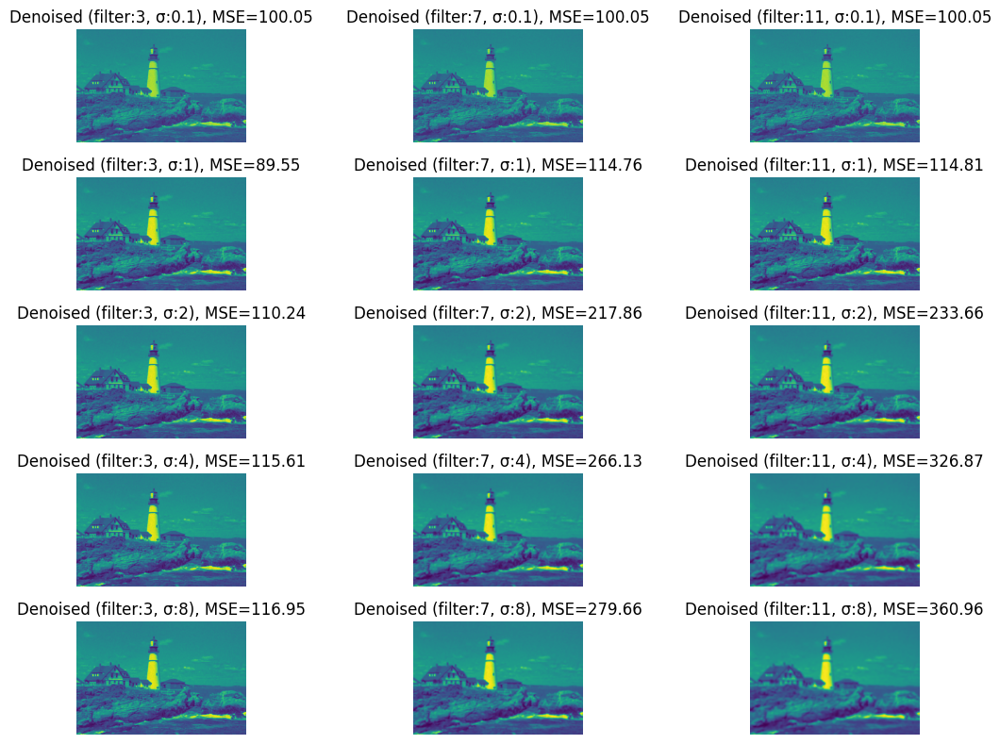

In [ ]:
def Using_gaussian_denoise_image(image,noisy_img,filter_length,sigma):
      denoised_image = cv2.GaussianBlur(noisy_img, (filter_length, filter_length), sigma)
      mse = np.mean((image - denoised_image) ** 2)
      return denoised_image,mse

filter_length = [3, 7, 11]
sigma = [0.1, 1, 2, 4, 8]
fig, axs=plt.subplots(5, 3, figsize=(12, 8))
for i in range(3):
  for j in range(5):
    denoised_image, mse = Using_gaussian_denoise_image(image,noisy_img, filter_length[i], sigma[j])
    axs[j,i].imshow(denoised_image)
    axs[j,i].set_title(f"Denoised (filter:{filter_length[int(i)]}, σ:{sigma[int(j)]}), MSE={ np.round(mse, decimals=2)}")
    axs[j,i].axis('off')

plt.tight_layout()
plt.show()

# sigma =1 and filter_length=3 give minimumu MSE according to plot

# Questions 2.2 Adaptive MMSE:

In [ ]:
class MMSE_Estimate():
  def __init__(self,original_img, noisy_img,kernal_size,sigma):
    self.original_img=original_img
    self.noisy_img=noisy_img
    self.kernal_size=kernal_size
    self.sigma=sigma
    self.low_pass_img=cv2.GaussianBlur(self.noisy_img, (self.kernal_size, self.kernal_size), self.sigma)
    self.high_pass_img=self.noisy_img - self.low_pass_img
    self.variance_z=100
    self.patch_size=32
    self.overlap=16

  def variance_z1(self):
    if self.kernal_size % 2 == 0:
      self.kernal_size += 1
    x = np.linspace(-(self.kernal_size // 2), self.kernal_size // 2, self.kernal_size)
    y = x.reshape(self.kernal_size, 1)
    gauss = np.exp(-(x**2 + y**2) / (2.0 * self.sigma**2))
    gauss = gauss / np.sum(gauss)
    variance_z1= (((1-gauss[1,1])**2) + np.sum(gauss**2)-gauss[1,1]**2)*self.variance_z
    return variance_z1

  def calculation_x1_hat(self):
    x1_hat = np.zeros((512,768),dtype='float')
    counts=np.zeros((512,768),dtype='int')
    height, width = self.high_pass_img.shape
    for y in range(0, height - self.patch_size + 1, self.overlap):
      for x in range(0, width - self.patch_size + 1, self.overlap):
        patch = self.high_pass_img[y:y + self.patch_size, x:x + self.patch_size]
        variance_y1=np.var(patch)
        variance_x1=variance_y1-self.variance_z1()
        x1_hat_per_patch=(variance_x1/(variance_x1+self.variance_z1()))*patch
        x1_hat[y:y + self.patch_size, x:x + self.patch_size]+=x1_hat_per_patch
        counts[y:y + self.patch_size, x:x + self.patch_size]+=1
    x1_hat=x1_hat/counts
    return x1_hat

  def denoised_image(self):
    return self.low_pass_img + self.calculation_x1_hat()

  def MSE_Calculation(self):
    return np.mean((self.original_img - self.denoised_image())**2)

  def Plot_Results(self):
    fig, axs = plt.subplots(1, 3, figsize=(22, 15))
    axs[0].imshow(self.original_img, cmap='gray')
    axs[0].set_title('Original Image')
    axs[1].imshow(self.noisy_img, cmap='gray')
    axs[1].set_title('Noisy Image')
    axs[2].imshow(self.denoised_image(), cmap='gray')
    axs[2].set_title(f'Denoised Image with filter_size: {self.kernal_size}, SIGMA: {self.sigma}, MSE: {self.MSE_Calculation():.2f}')
    print(f'from MMSE Estimation with filter_size {self.kernal_size} and sigma_value {self.sigma} we obtained mean_squeared_error(MSE): {self.MSE_Calculation():.2f}')
    print()
    plt.show()
    return

## First fixed sigma_value and vary filter_size

from MMSE Estimation with filter_size 3 and sigma_value 1.0 we obtained mean_squeared_error(MSE): 42.03



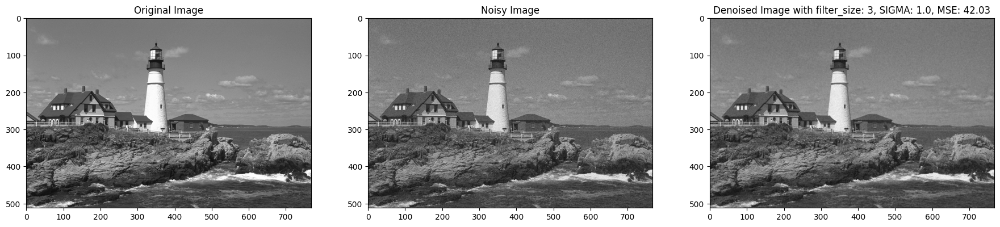

In [ ]:
Adaptive_MMSE = MMSE_Estimate(image, noisy_img,kernal_size=3,sigma=1.0)
Adaptive_MMSE.Plot_Results()

from MMSE Estimation with filter_size 7 and sigma_value 1.0 we obtained mean_squeared_error(MSE): 45.47



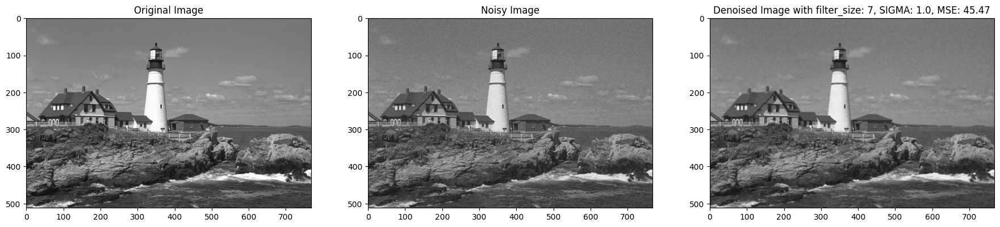

In [ ]:
Adaptive_MMSE = MMSE_Estimate(image, noisy_img,kernal_size=7,sigma=1.0)
Adaptive_MMSE.Plot_Results()

from MMSE Estimation with filter_size 11 and sigma_value 1.0 we obtained mean_squeared_error(MSE): 45.68



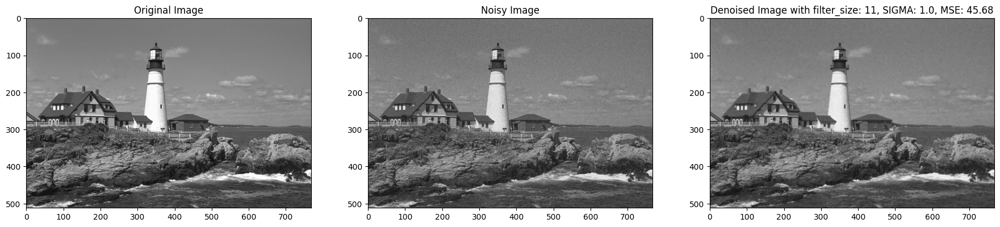

In [ ]:
Adaptive_MMSE = MMSE_Estimate(image, noisy_img,kernal_size=11,sigma=1.0)
Adaptive_MMSE.Plot_Results()

## Now fixed filter_size(based on above good results) and vary the sigma_values

from MMSE Estimation with filter_size 3 and sigma_value 2 we obtained mean_squeared_error(MSE): 41.92



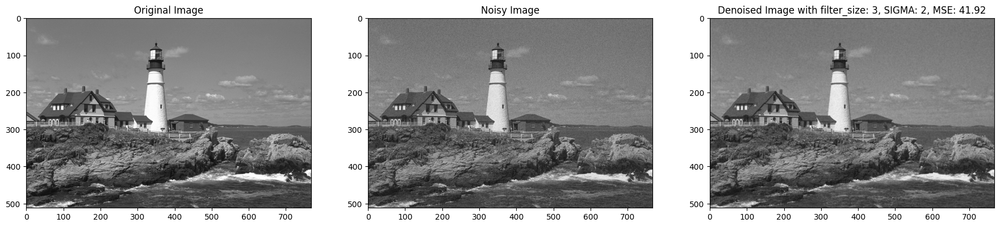

In [ ]:
Adaptive_MMSE = MMSE_Estimate(image, noisy_img,kernal_size=3,sigma=2)
Adaptive_MMSE.Plot_Results()

from MMSE Estimation with filter_size 3 and sigma_value 4 we obtained mean_squeared_error(MSE): 42.05



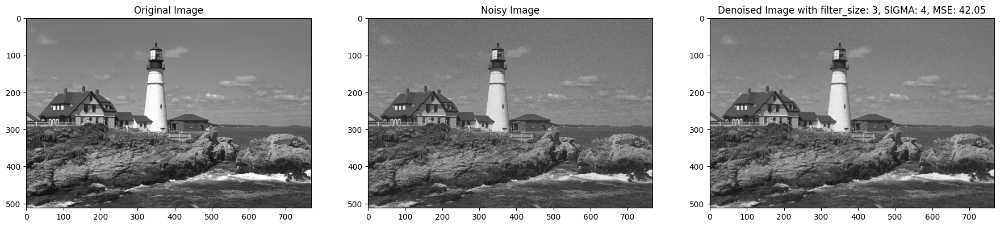

In [ ]:
Adaptive_MMSE = MMSE_Estimate(image, noisy_img,kernal_size=3,sigma=4)
Adaptive_MMSE.Plot_Results()

from MMSE Estimation with filter_size 3 and sigma_value 8 we obtained mean_squeared_error(MSE): 42.10



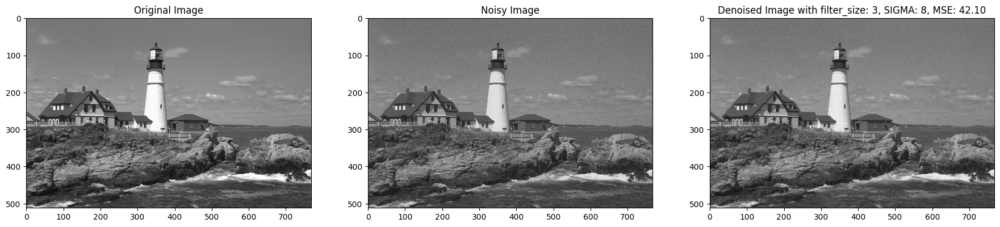

In [ ]:
Adaptive_MMSE = MMSE_Estimate(image, noisy_img,kernal_size=3,sigma=8)
Adaptive_MMSE.Plot_Results()

# Question 2.3 Adaptive Shrinkage

In [ ]:
class Shrinkage_Estimation():
  def __init__(self,original_img, noisy_img,kernal_size,sigma):
    self.t=np.linspace(0,100,300)
    self.original_img=original_img
    self.noisy_img=noisy_img
    self.kernal_size=kernal_size
    self.sigma=sigma
    self.low_pass_img=cv2.GaussianBlur(self.noisy_img, (self.kernal_size, self.kernal_size), self.sigma)
    self.high_pass_img=self.noisy_img - self.low_pass_img
    self.variance_z=100
    self.patch_size=32
    return

  def variance_z1(self):
    if self.kernal_size % 2 == 0:
      self.kernal_size += 1
    x = np.linspace(-(self.kernal_size // 2), self.kernal_size // 2, self.kernal_size)
    y = x.reshape(self.kernal_size, 1)
    gauss = np.exp(-(x**2 + y**2) / (2.0 * self.sigma**2))
    gauss = gauss / np.sum(gauss)
    variance_z1= (((1-gauss[1,1])**2) + np.sum(gauss**2)-gauss[1,1]**2)*self.variance_z
    return variance_z1

  def g_square(self,y1,t):
      matrix=np.zeros(y1.shape, dtype='float')
      for m in range(y1.shape[0]):
        for n in range(y1.shape[1]):
           matrix[m][n]=min(y1[m][n],t)**2
      return np.sum(matrix)

  def dg_dy1(self,y1,t):
    count=0
    for m in range(y1.shape[0]):
      for n in range(y1.shape[1]):
        if (np.abs(y1[m][n])<t):
          count+=1
    return -count

  def t_from_SURE(self,y1,variance_z1):
      MN = y1.size
      result=[]
      for t in self.t:
        term1 = MN * variance_z1
        term2 = self.g_square(y1,t)
        term3 = 2 * variance_z1 * self.dg_dy1(y1,t)
        res=term1 + term2 + term3
        result.append(res)
      t_index=np.argmin(result)
      return self.t[t_index]


  def x1_hat_Estimation(self):
    x1_hat = np.zeros((512,768),dtype='float')
    height, width = self.high_pass_img.shape
    t_values_per_patch=[]
    for y in range(0, height - self.patch_size + 1, self.patch_size):
        for x in range(0, width - self.patch_size + 1, self.patch_size):
            patch = self.high_pass_img[y:y + self.patch_size, x:x + self.patch_size]
            t=self.t_from_SURE(patch,self.variance_z1())
            t_values_per_patch.append(t)
            x1_hat_per_patch=np.zeros((32,32), dtype='float')
            for m in range(32):
              for n in range(32):
                x1_hat_per_patch[m][n]=(np.sign(patch[m][n]))*(max(np.abs(patch[m][n])-t,0))
            x1_hat[y:y + self.patch_size, x:x + self.patch_size]=x1_hat_per_patch
    return x1_hat

  def denoised_image(self):
    return self.low_pass_img + self.x1_hat_Estimation()

  def MSE_Calculation(self):
    return np.mean((self.original_img - self.denoised_image())**2)

  def Plot_Results(self):
    mse=self.MSE_Calculation()
    fig, axs = plt.subplots(1, 3, figsize=(22, 15))
    axs[0].imshow(self.original_img, cmap='gray')
    axs[0].set_title('Original Image')
    axs[1].imshow(self.noisy_img, cmap='gray')
    axs[1].set_title('Noisy Image')
    axs[2].imshow(self.denoised_image(), cmap='gray')
    axs[2].set_title(f'Denoised Image with filter_size: {self.kernal_size}, SIGMA: {self.sigma}, MSE: {mse:.2f}')
    print(f'from Shrinkage Estimation with filter_size {self.kernal_size} and sigma_value {self.sigma} we obtained mean_squeared_error(MSE): {mse:.2f}')
    print()
    plt.show()
    return



## First fixed sigma_value and vary filter_size

from Shrinkage Estimation with filter_size 3 and sigma_value 1.0 we obtained mean_squeared_error(MSE): 50.06



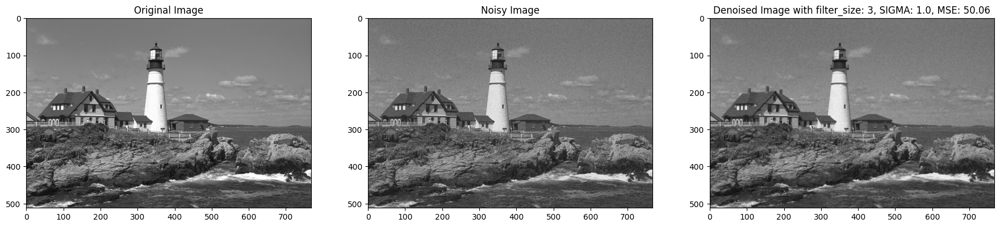

In [ ]:
Adaptive_Shrinkage=Shrinkage_Estimation(image, noisy_img,kernal_size=3,sigma=1.0)
Adaptive_Shrinkage.Plot_Results()

from Shrinkage Estimation with filter_size 7 and sigma_value 1.0 we obtained mean_squeared_error(MSE): 62.44



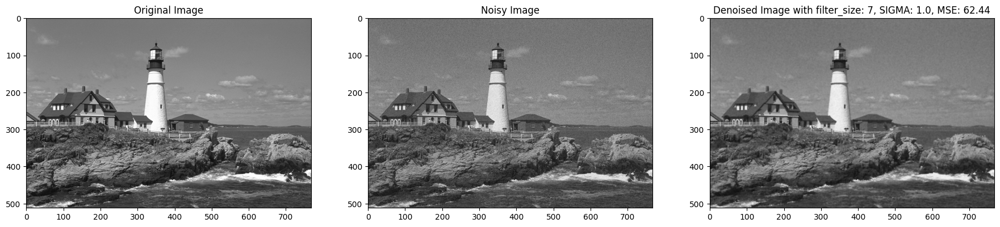

In [ ]:
Adaptive_Shrinkage=Shrinkage_Estimation(image, noisy_img,kernal_size=7,sigma=1.0)
Adaptive_Shrinkage.Plot_Results()

from Shrinkage Estimation with filter_size 11 and sigma_value 1.0 we obtained mean_squeared_error(MSE): 62.75



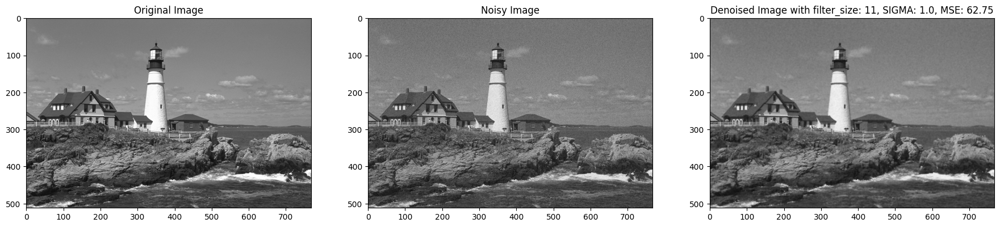

In [ ]:
Adaptive_Shrinkage=Shrinkage_Estimation(image, noisy_img,kernal_size=11,sigma=1.0)
Adaptive_Shrinkage.Plot_Results()

## Now fixed filter_size(based on above good results) and vary sigma_values

from Shrinkage Estimation with filter_size 3 and sigma_value 0.1 we obtained mean_squeared_error(MSE): 100.05



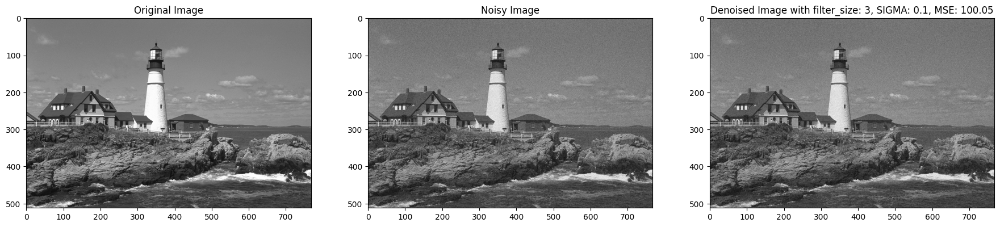

In [ ]:
Adaptive_Shrinkage=Shrinkage_Estimation(image, noisy_img,kernal_size=3,sigma=0.1)
Adaptive_Shrinkage.Plot_Results()

from Shrinkage Estimation with filter_size 3 and sigma_value 2.0 we obtained mean_squeared_error(MSE): 55.00



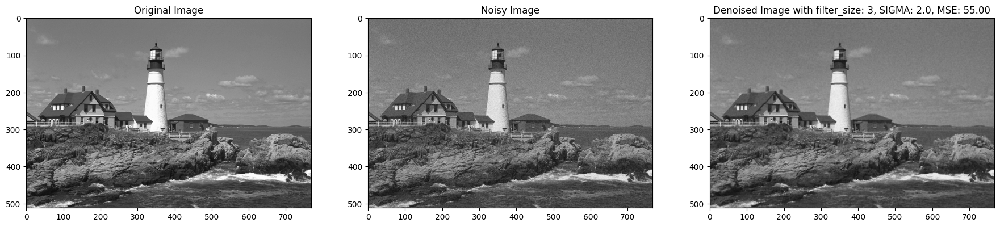

In [ ]:
Adaptive_Shrinkage=Shrinkage_Estimation(image, noisy_img,kernal_size=3,sigma=2.0)
Adaptive_Shrinkage.Plot_Results()

from Shrinkage Estimation with filter_size 3 and sigma_value 4.0 we obtained mean_squeared_error(MSE): 56.40



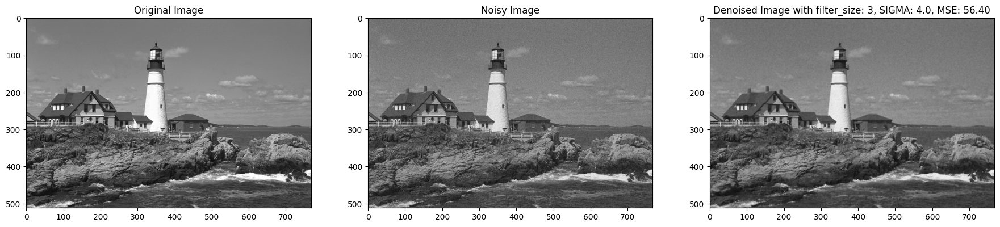

In [ ]:
Adaptive_Shrinkage=Shrinkage_Estimation(image, noisy_img,kernal_size=3,sigma=4.0)
Adaptive_Shrinkage.Plot_Results()

from Shrinkage Estimation with filter_size 3 and sigma_value 8.0 we obtained mean_squeared_error(MSE): 56.67



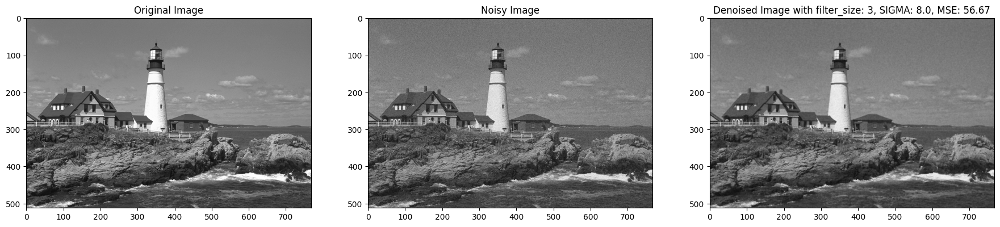

In [ ]:
Adaptive_Shrinkage=Shrinkage_Estimation(image, noisy_img,kernal_size=3,sigma=8.0)
Adaptive_Shrinkage.Plot_Results()